In [159]:
import sys
import os
import argparse
import warnings
import numpy as np
import pandas as pd
import nibabel as nib
import seaborn as sns
import matplotlib.pyplot as plt
from nilearn import image, masking, plotting
from glob import glob
from pyrelimri import similarity
from itertools import product
warnings.filterwarnings("ignore")

In [156]:
sample='abcd'
out_dir='/scratch.global/mdemiden/analyses_reliability'
icc_est=f'{out_dir}/icc_perm/run'
group_out=f'{out_dir}/group/abcd_run'

In [107]:
# load ICC images
# icc
icc_supra_imgs = sorted(glob(f'{icc_est}/*wilson-supra_*stat-est.nii.gz'))
icc_sub_imgs = sorted(glob(f'{icc_est}/*wilson-sub_*stat-est.nii.gz'))
# msbs 
bs_supra_imgs = sorted(glob(f'{icc_est}/*wilson-supra_*stat-msbtwn.nii.gz'))
bs_sub_imgs = sorted(glob(f'{icc_est}/*wilson-sub_*stat-msbtwn.nii.gz'))
# msws
ws_supra_imgs = sorted(glob(f'{icc_est}/*wilson-supra_*stat-mswthn.nii.gz'))
ws_sub_imgs = sorted(glob(f'{icc_est}/*wilson-sub_*stat-mswthn.nii.gz'))

In [32]:
# load sub and supra masks
mask_supra = f'/home/faird/mdemiden/analyses/reliability/Multiverse_Reliability/Stage2_Code/brain_mask/MNI152_wilson-supra.nii.gz'
mask_sub = f'/home/faird/mdemiden/analyses/reliability/Multiverse_Reliability/Stage2_Code/brain_mask/MNI152_wilson-sub.nii.gz'

In [177]:
# icc
out_icc_supra = f'{out_dir}/sample-{sample}_type-run_stats-est_mask-wilson-supra.tsv'
out_icc_sub = f'{out_dir}/sample-{sample}_type-run_stats-est_mask-wilson-sub.tsv'
# msbs
out_bs_supra = f'{out_dir}/sample-{sample}_type-run_stats-bs_mask-wilson-supra.tsv'
out_bs_sub = f'{out_dir}/sample-{sample}_type-run_stats-bs_mask-wilson-sub.tsv'
# msws
out_ws_supra = f'{out_dir}/sample-{sample}_type-run_stats-ws_mask-wilson-supra.tsv'
out_ws_sub = f'{out_dir}/sample-{sample}_type-run_stats-ws_mask-wilson-sub.tsv'
# similarity 
out_similarity= f'{out_dir}/sample-{sample}_type-run_stats-similarity.tsv'

In [72]:
def extract_median(img_list, mask_img):
    data_list = []
    for img in img_list:
        base_name = os.path.basename(img)
        mask, con, mni, motion, model, fwhm = base_name.split('_')[2:8]
    
        # get median value
        nifti_img = image.load_img(img)
        masked_data = masking.apply_mask(nifti_img, mask_img)
        median_est = np.round(np.median(masked_data), 3)
        
        data_list.append({
            'mask': mask,
            'con': con,
            'motion': motion,
            'model': model,
            'fwhm': fwhm,
            'median_est': median_est
        })
    return pd.DataFrame(data_list)

def file_exists(file_path):
    return os.path.exists(file_path)

# if file doesnt exist, extract media and create file, otherwise load file 
def process_dataset(imgs, mask, out_file):
    if not file_exists(out_file):
        print(f'file {out_file} doesnt exist, creating')
        df = extract_median(imgs, mask)
        df.to_csv(out_file, sep='\t', index=False)
    else:
        print(f'Loading existing {out_file}')
        df = pd.read_csv(out_file, sep='\t')
    return df

# Means and Stand Dev of Models

For Aim 1 (ICC estimate) and Aim 2 (Mean Square Between Subject and Within Subject Variance), stated would include:
"First, voxel-wise average and standard deviation from the resulting ICCs for the 360 model permutations are reported in two 3D volumes."

## ICC est

In [39]:
img_list = [image.load_img(img_path) for img_path in icc_supra_imgs]
img_data = np.stack([img.get_fdata() for img in img_list], axis=-1)

mean_img_data = np.mean(img_data, axis=-1)
icc_mean_img = image.new_img_like(img_list[0], mean_img_data)
sd_img_data = np.std(img_data, axis=-1)
icc_sd_img = image.new_img_like(img_list[0], sd_img_data)


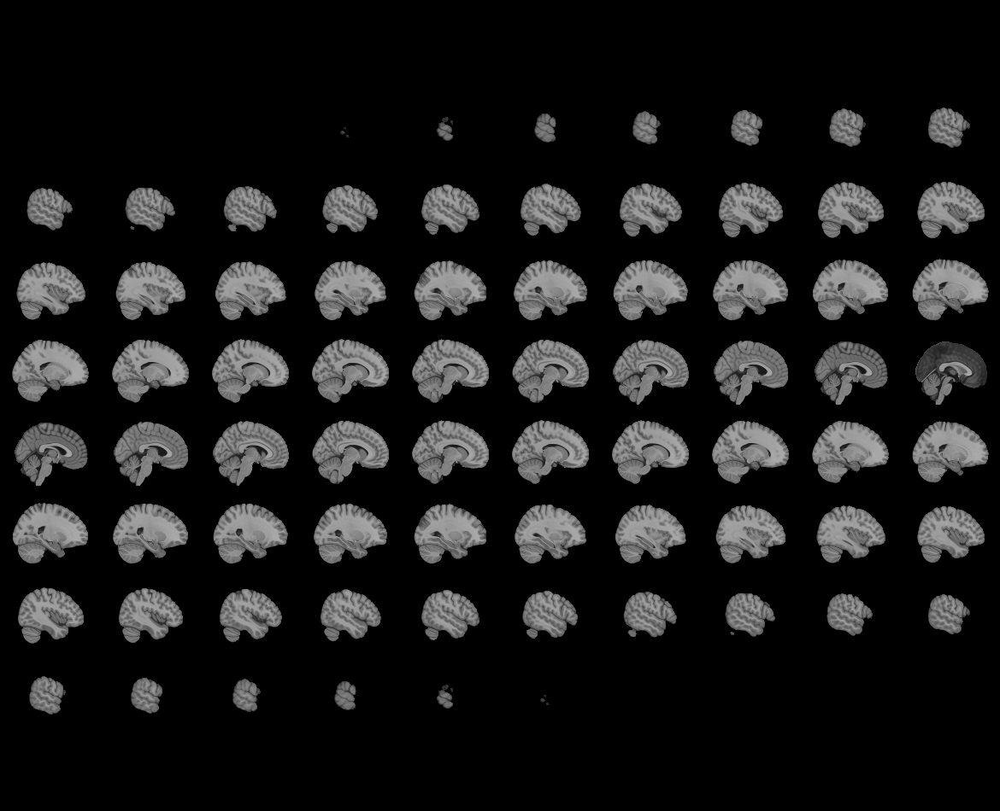
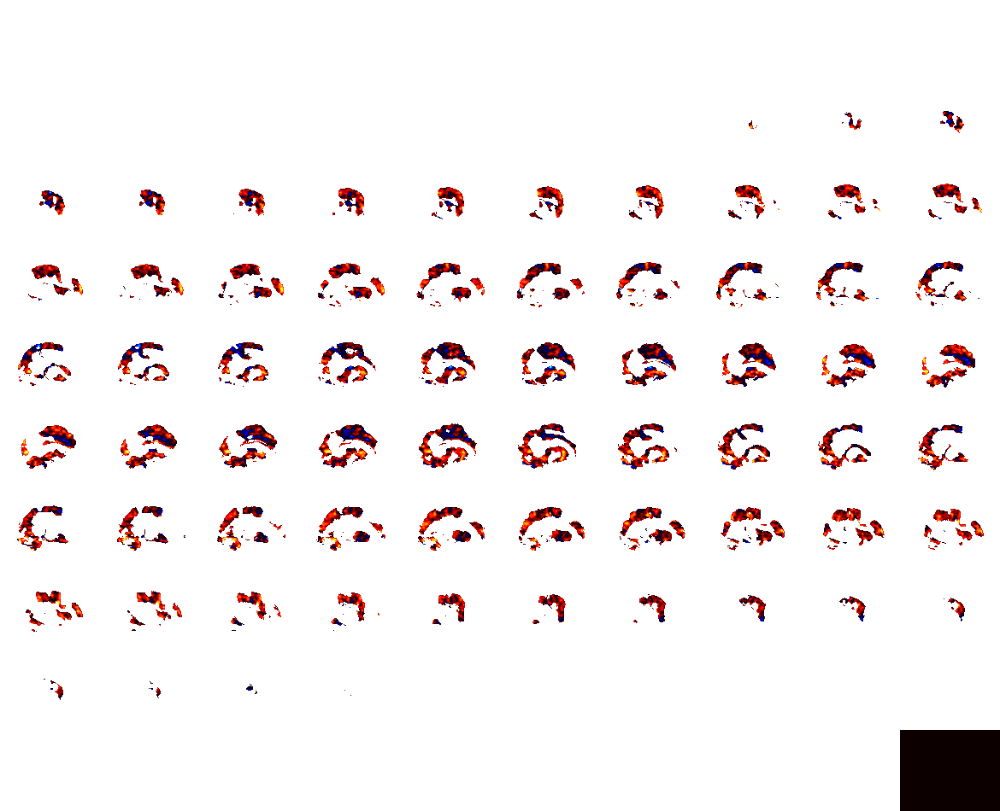

In [40]:
plotting.view_img(icc_mean_img)


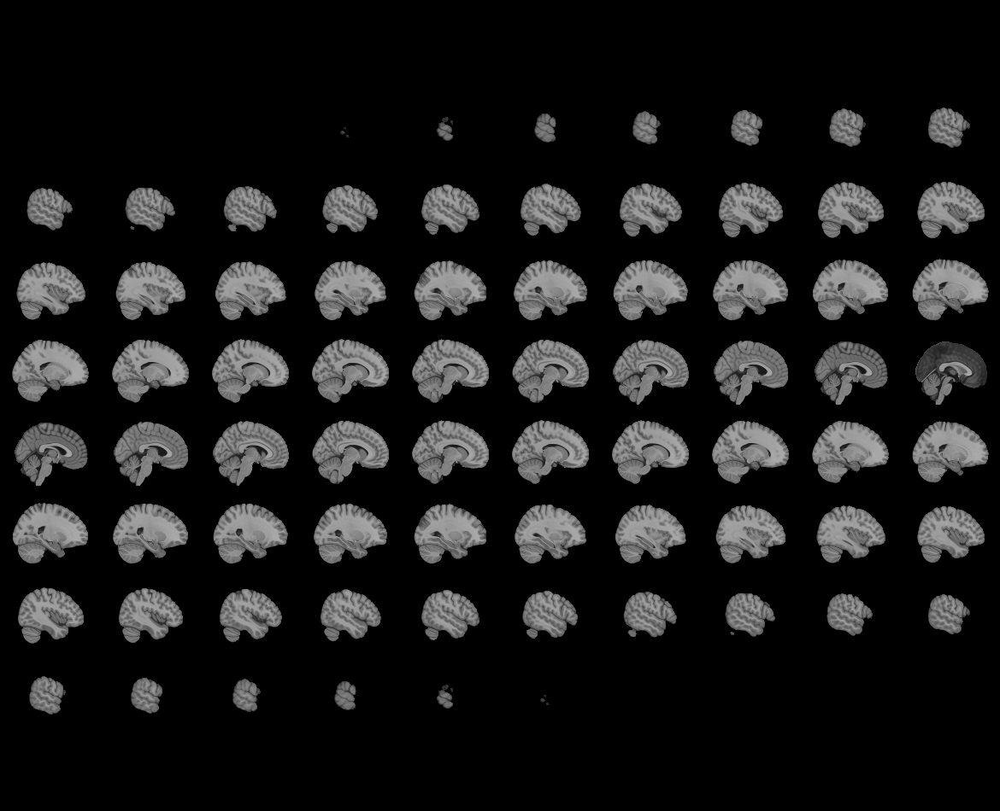
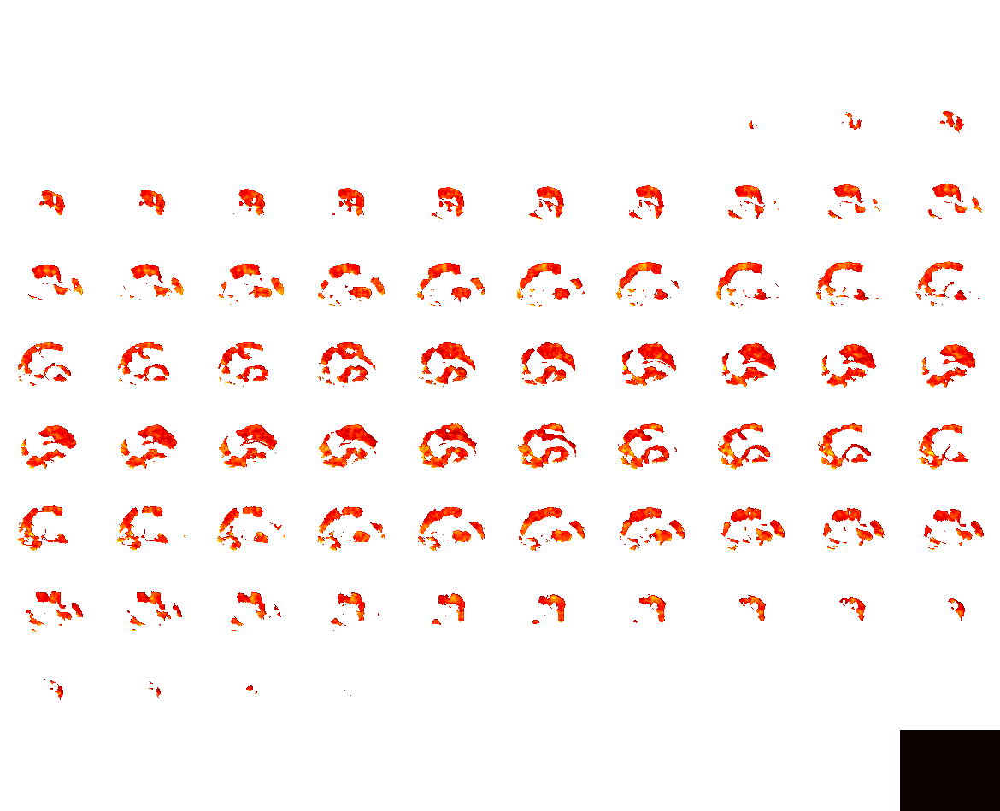

In [41]:
plotting.view_img(icc_sd_img)

## MSBS est

In [42]:
img_list = [image.load_img(img_path) for img_path in bs_supra_imgs]
img_data = np.stack([img.get_fdata() for img in img_list], axis=-1)

mean_img_data = np.mean(img_data, axis=-1)
bs_mean_img = image.new_img_like(img_list[0], mean_img_data)
sd_img_data = np.std(img_data, axis=-1)
bs_sd_img = image.new_img_like(img_list[0], sd_img_data)


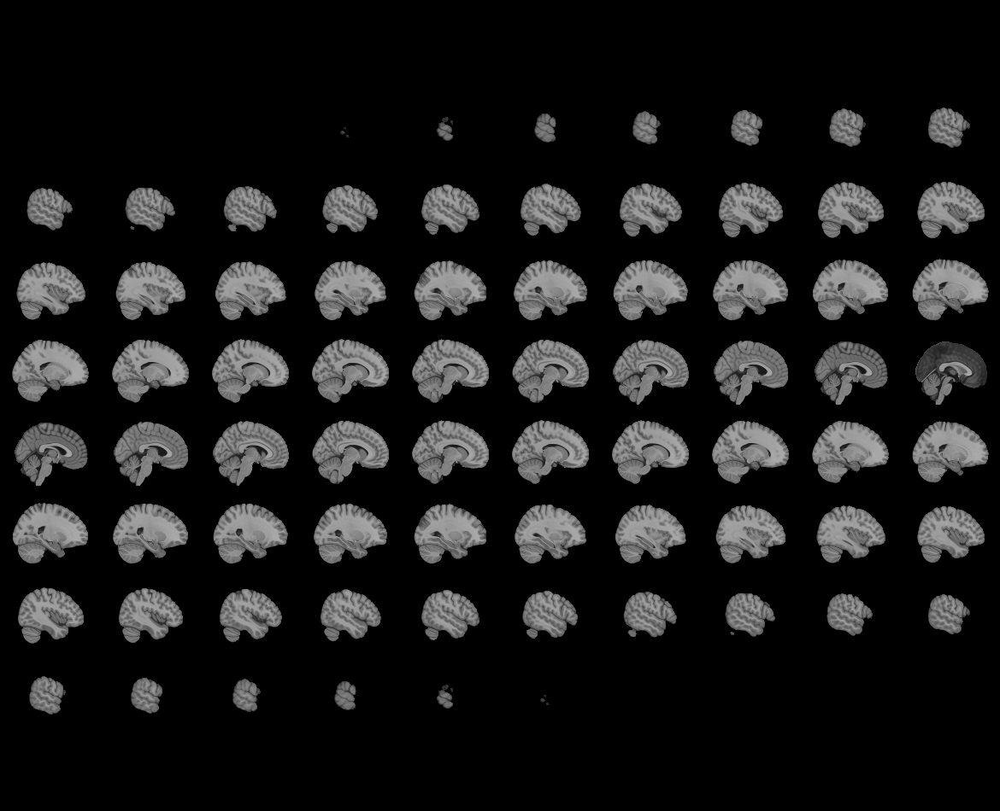
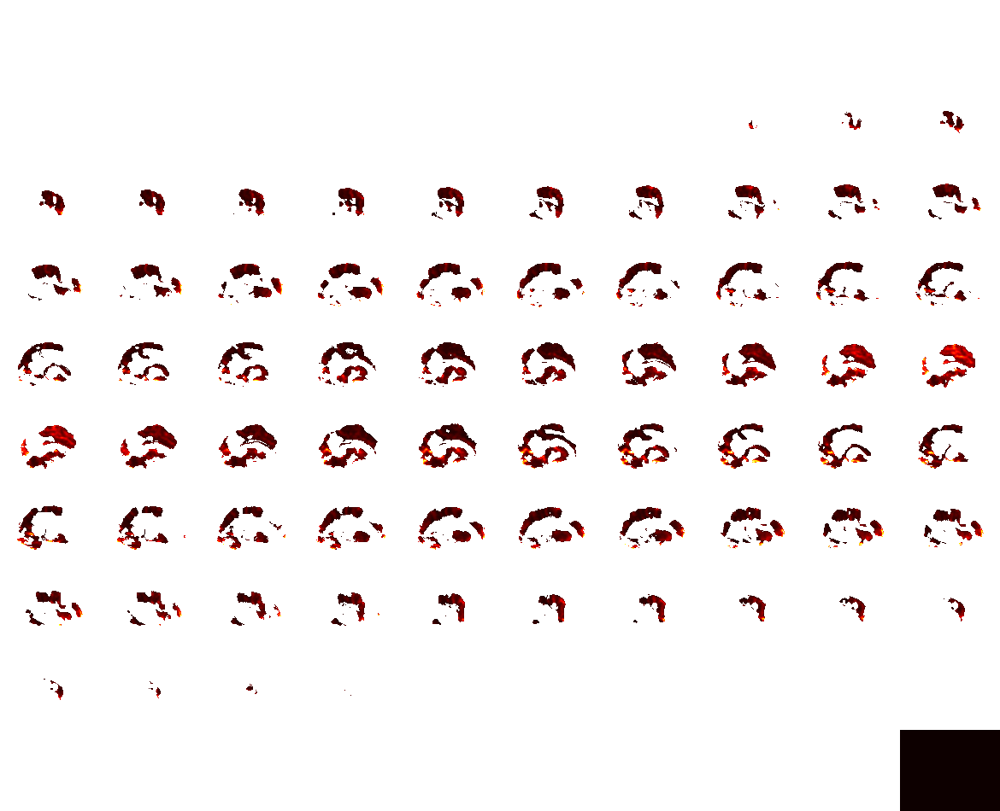

In [49]:
plotting.view_img(bs_mean_img, vmax=10)


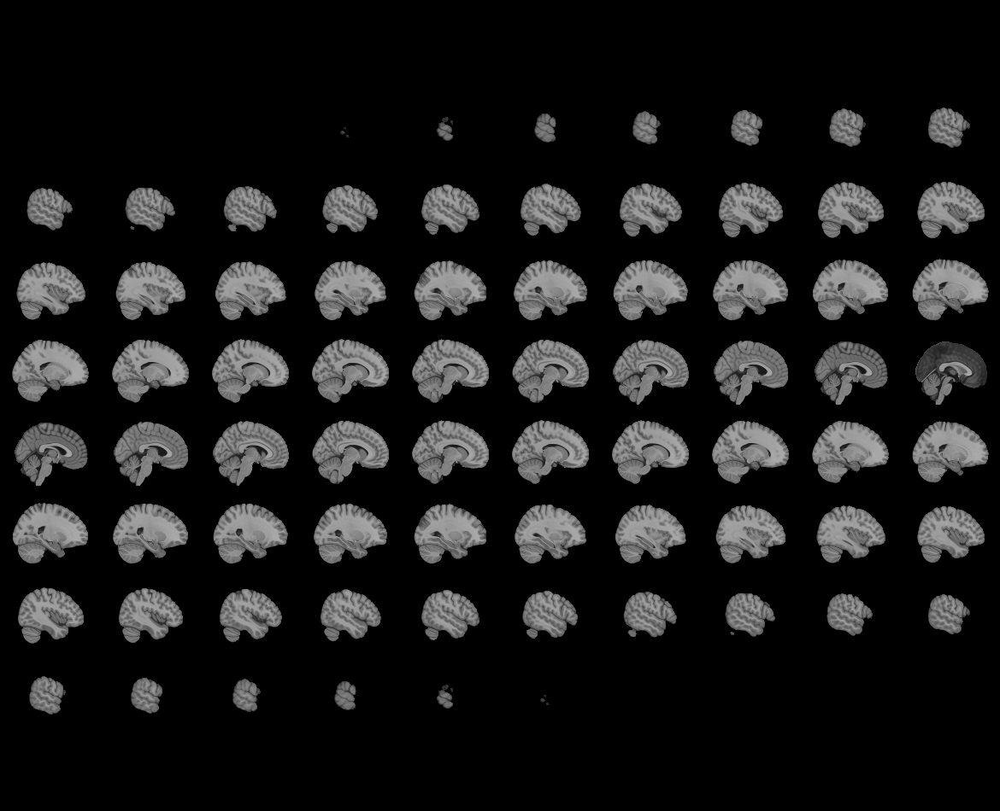
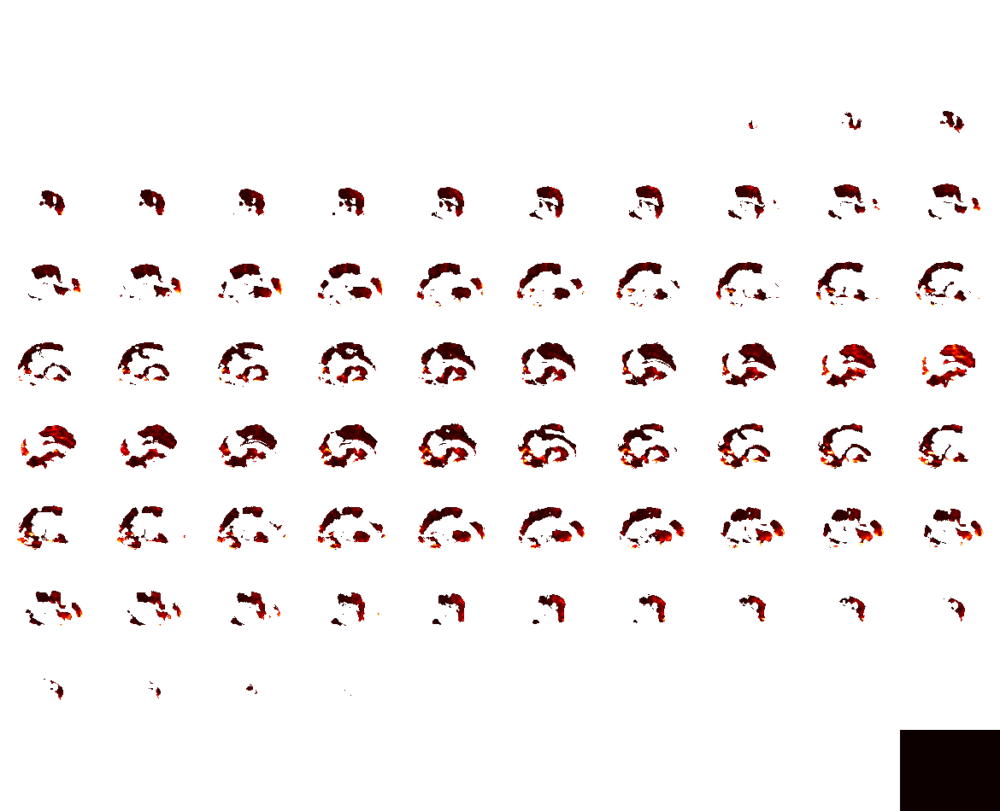

In [47]:
plotting.view_img(bs_sd_img, vmax=10)

## MSWS est

In [50]:
img_list = [image.load_img(img_path) for img_path in ws_supra_imgs]
img_data = np.stack([img.get_fdata() for img in img_list], axis=-1)

mean_img_data = np.mean(img_data, axis=-1)
ws_mean_img = image.new_img_like(img_list[0], mean_img_data)
sd_img_data = np.std(img_data, axis=-1)
ws_sd_img = image.new_img_like(img_list[0], sd_img_data)


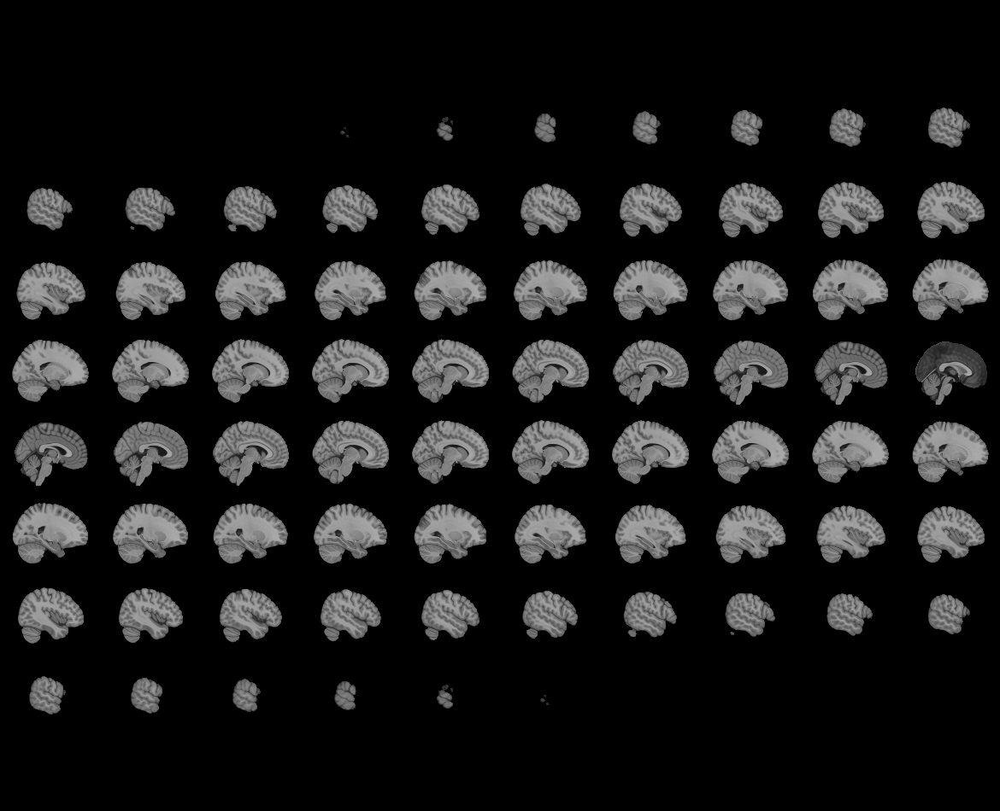
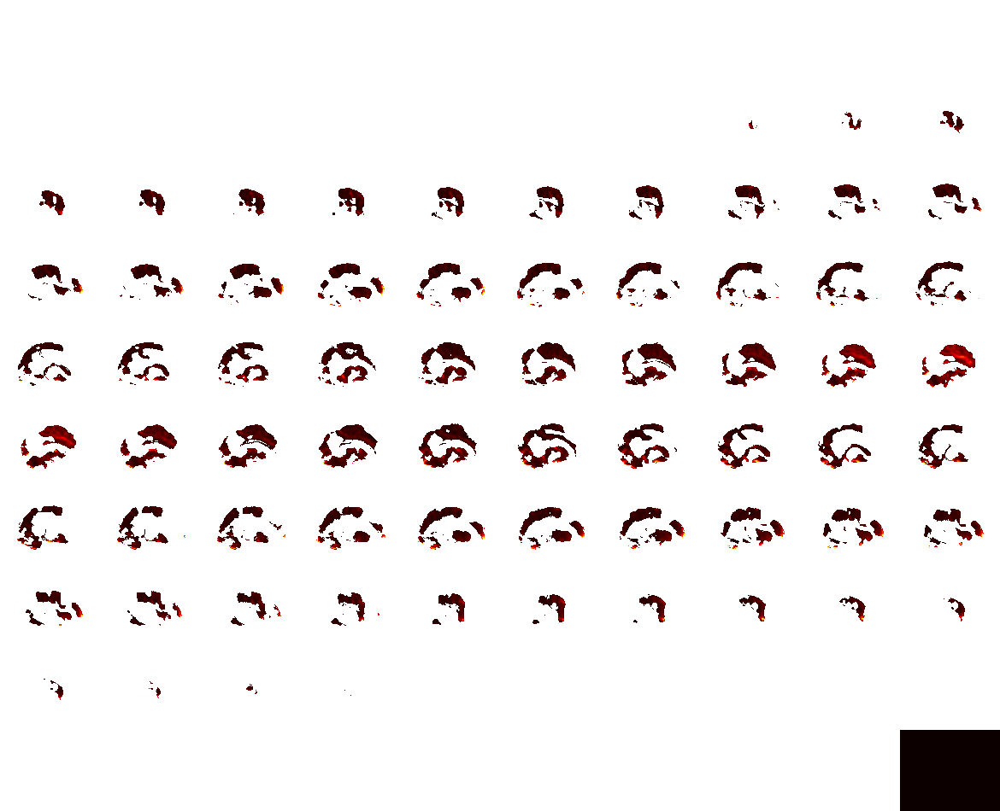

In [51]:
plotting.view_img(ws_mean_img, vmax=10)


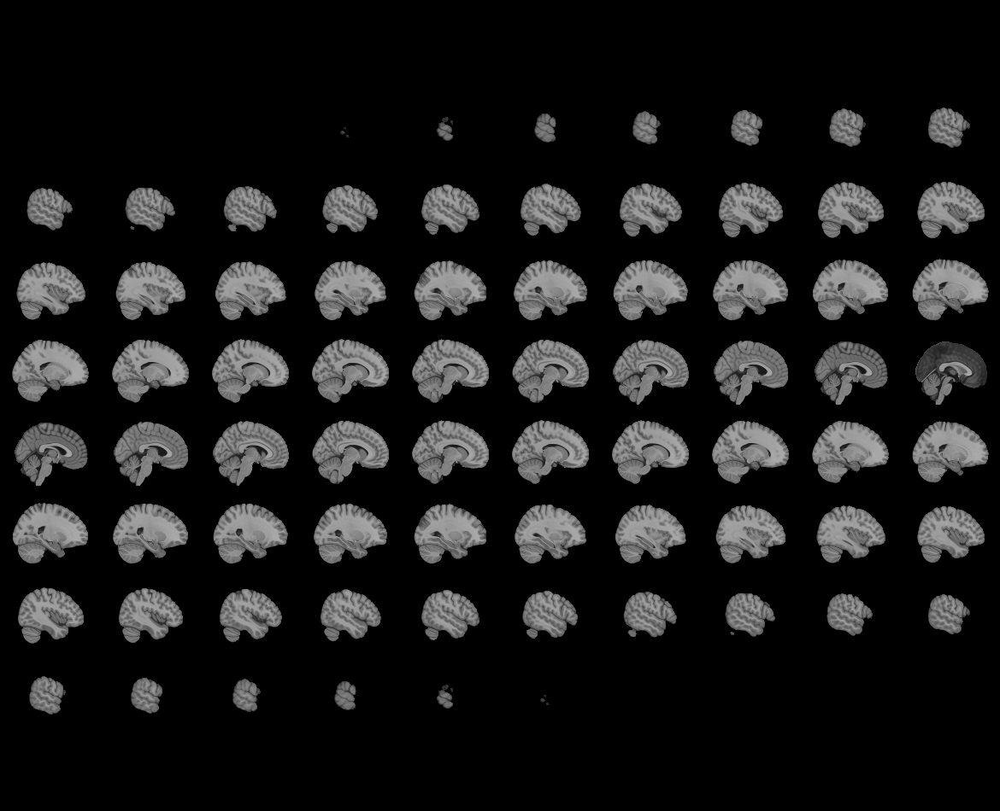
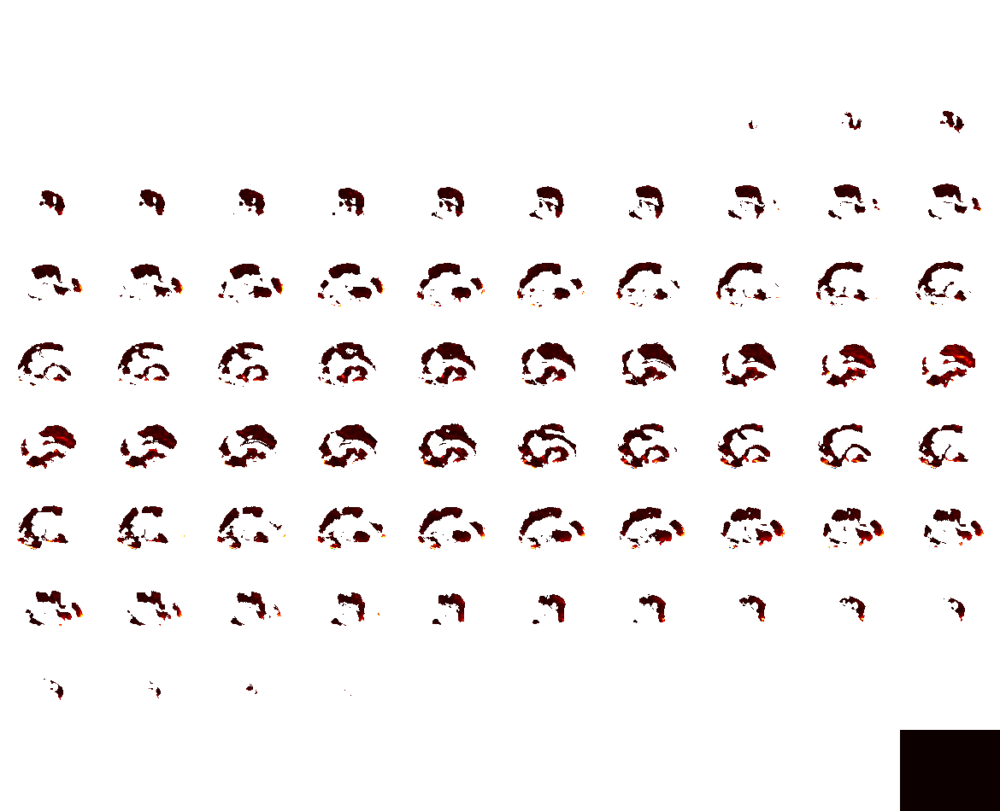

In [52]:
plotting.view_img(ws_sd_img, vmax=10)

# Loading files, Extracting median ICC and providing distribution

For Aim 1 and Aim 2 state would include:
"Second, the range and distribution of median ICCs across each study (three) and analytic decision category (four) are plotted across suprathreshold task-positive and subthreshold ICCs using Rainclouds (Allen et al., 2019) and the median and standard deviation is reported in a table."

While included here to rank and contain some information, plots will be created in R using raincloud features that are more powerful

In [108]:
# icc datasets
df_icc_supra = process_dataset(icc_supra_imgs, mask_supra, out_icc_supra)
df_icc_sub = process_dataset(icc_sub_imgs, mask_sub, out_icc_sub)

# msbs datasets
df_bs_supra = process_dataset(bs_supra_imgs, mask_supra, out_bs_supra)
df_bs_sub = process_dataset(bs_sub_imgs, mask_sub, out_bs_sub)

# msws datasets
df_ws_supra = process_dataset(ws_supra_imgs, mask_supra, out_ws_supra)
df_ws_sub = process_dataset(ws_sub_imgs, mask_sub, out_ws_sub)

Loading existing /scratch.global/mdemiden/analyses_reliability/sample-abcd_type-run_stats-est_mask-wilson-supra.tsv
Loading existing /scratch.global/mdemiden/analyses_reliability/sample-abcd_type-run_stats-est_mask-wilson-sub.tsv
file /scratch.global/mdemiden/analyses_reliability/sample-abcd_type-run_stats-bs_mask-wilson-supra.tsv doesnt exist, creating
file /scratch.global/mdemiden/analyses_reliability/sample-abcd_type-run_stats-bs_mask-wilson-sub.tsv doesnt exist, creating
Loading existing /scratch.global/mdemiden/analyses_reliability/sample-abcd_type-run_stats-ws_mask-wilson-supra.tsv
Loading existing /scratch.global/mdemiden/analyses_reliability/sample-abcd_type-run_stats-ws_mask-wilson-sub.tsv


### sort ICC by median est + img of highest

In [54]:
df_icc_sub.sort_values(by='median_est', ascending=False)

,mask,con,motion,model,fwhm,median_est
9,mask-wilson-sub,contrast-Lgain-Base,mot-opt1,mod-CueMod,fwhm-8.4,0.373
8,mask-wilson-sub,contrast-Lgain-Base,mot-opt1,mod-CueMod,fwhm-7.2,0.356
7,mask-wilson-sub,contrast-Lgain-Base,mot-opt1,mod-CueMod,fwhm-6.0,0.334
24,mask-wilson-sub,contrast-Lgain-Base,mot-opt2,mod-CueMod,fwhm-8.4,0.315
39,mask-wilson-sub,contrast-Lgain-Base,mot-opt3,mod-CueMod,fwhm-8.4,0.311
...,...,...,...,...,...,...
269,mask-wilson-sub,contrast-Sgain-Neut,mot-opt3,mod-FixMod,fwhm-8.4,-0.094
252,mask-wilson-sub,contrast-Sgain-Neut,mot-opt2,mod-FixMod,fwhm-6.0,-0.095
244,mask-wilson-sub,contrast-Sgain-Neut,mot-opt2,mod-AntMod,fwhm-8.4,-0.101
253,mask-wilson-sub,contrast-Sgain-Neut,mot-opt2,mod-FixMod,fwhm-7.2,-0.112



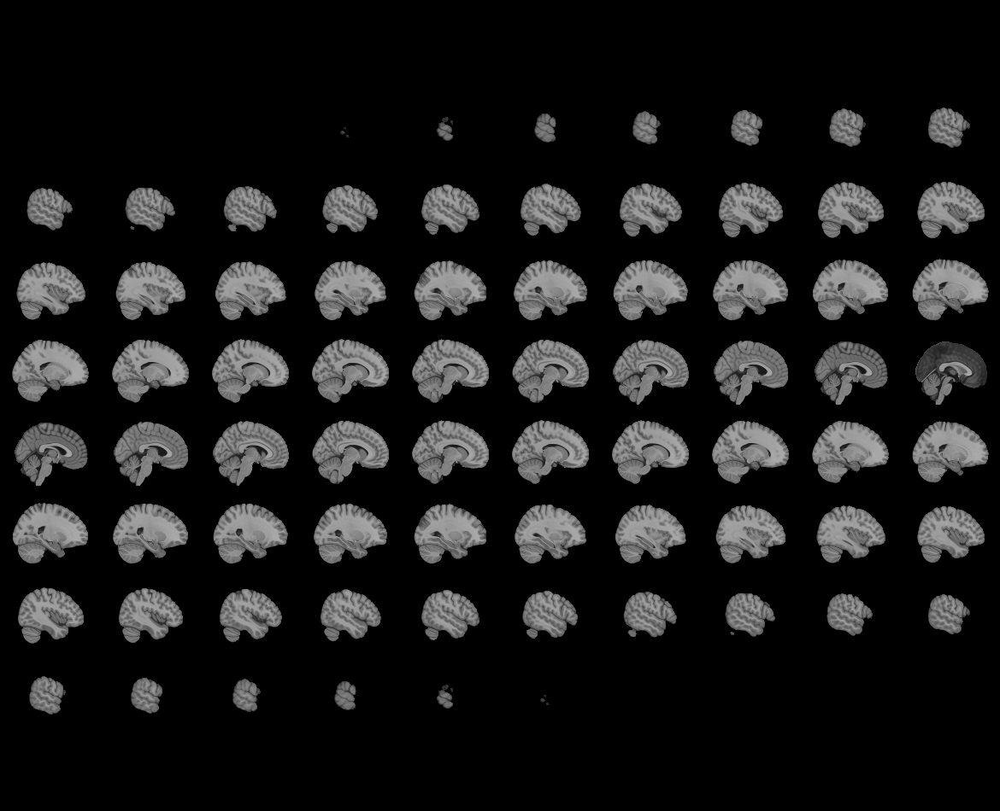
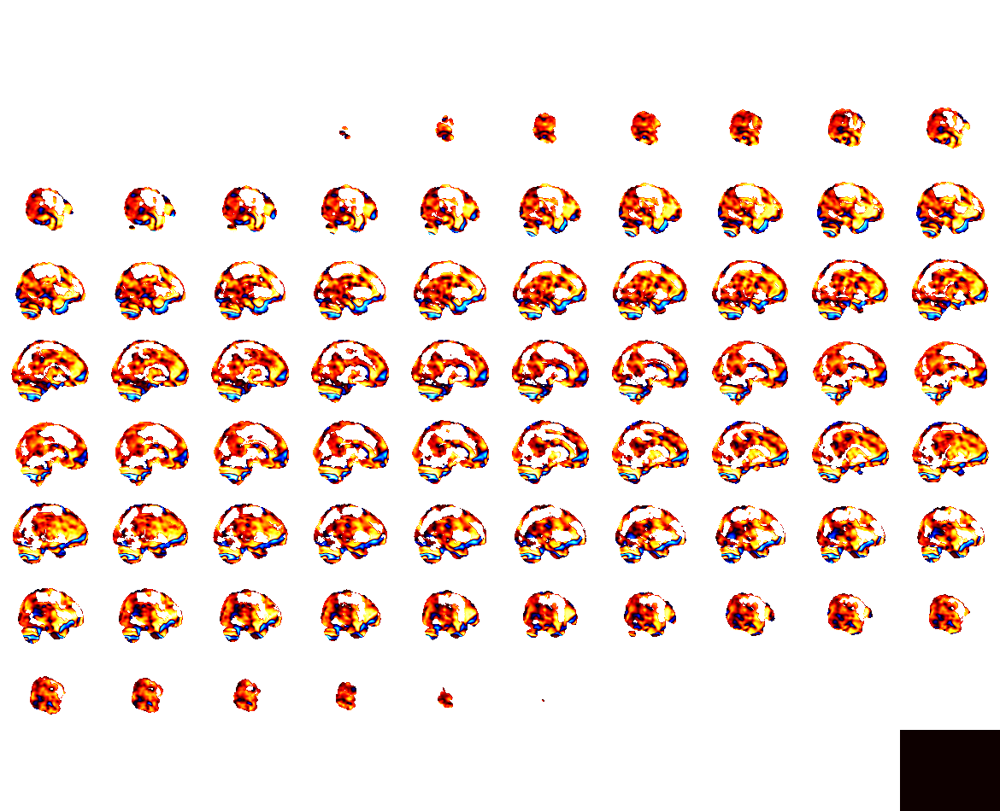

In [118]:
plotting.view_img(icc_sub_imgs[9], vmax = 1)

In [56]:
df_icc_supra.sort_values(by='median_est', ascending=False)

,mask,con,motion,model,fwhm,median_est
9,mask-wilson-supra,contrast-Lgain-Base,mot-opt1,mod-CueMod,fwhm-8.4,0.494
8,mask-wilson-supra,contrast-Lgain-Base,mot-opt1,mod-CueMod,fwhm-7.2,0.476
7,mask-wilson-supra,contrast-Lgain-Base,mot-opt1,mod-CueMod,fwhm-6.0,0.450
204,mask-wilson-supra,contrast-Sgain-Base,mot-opt4,mod-CueMod,fwhm-8.4,0.445
219,mask-wilson-supra,contrast-Sgain-Base,mot-opt5,mod-CueMod,fwhm-8.4,0.435
...,...,...,...,...,...,...
249,mask-wilson-supra,contrast-Sgain-Neut,mot-opt2,mod-CueMod,fwhm-8.4,-0.146
243,mask-wilson-supra,contrast-Sgain-Neut,mot-opt2,mod-AntMod,fwhm-7.2,-0.148
253,mask-wilson-supra,contrast-Sgain-Neut,mot-opt2,mod-FixMod,fwhm-7.2,-0.150
244,mask-wilson-supra,contrast-Sgain-Neut,mot-opt2,mod-AntMod,fwhm-8.4,-0.159



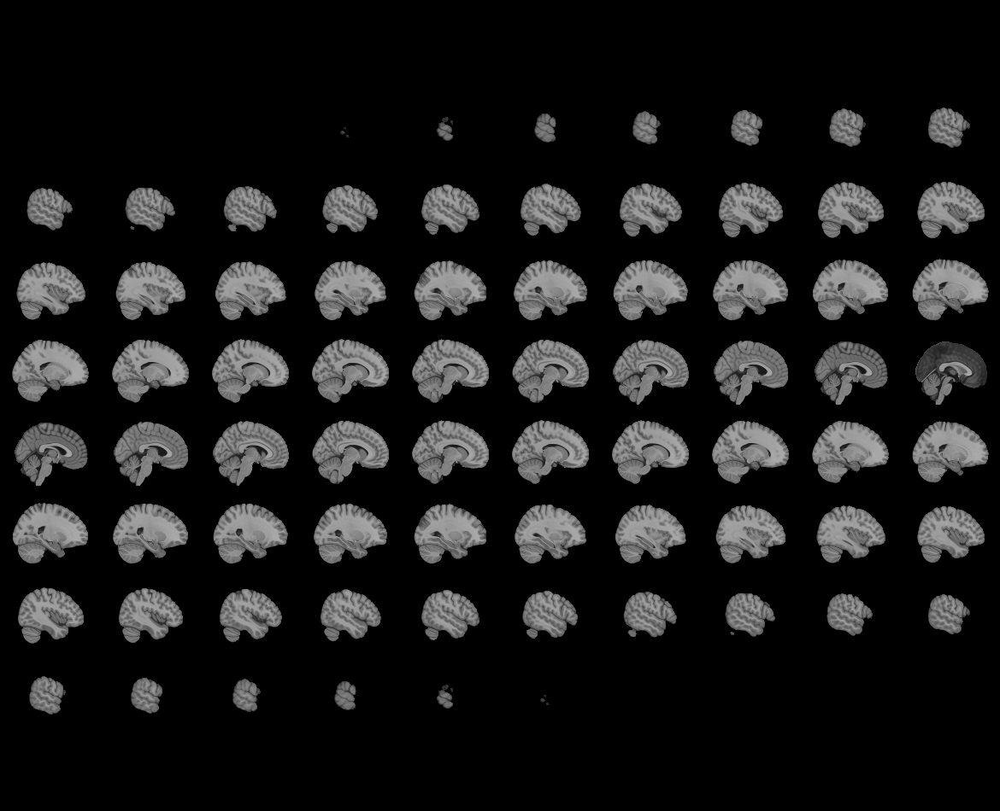
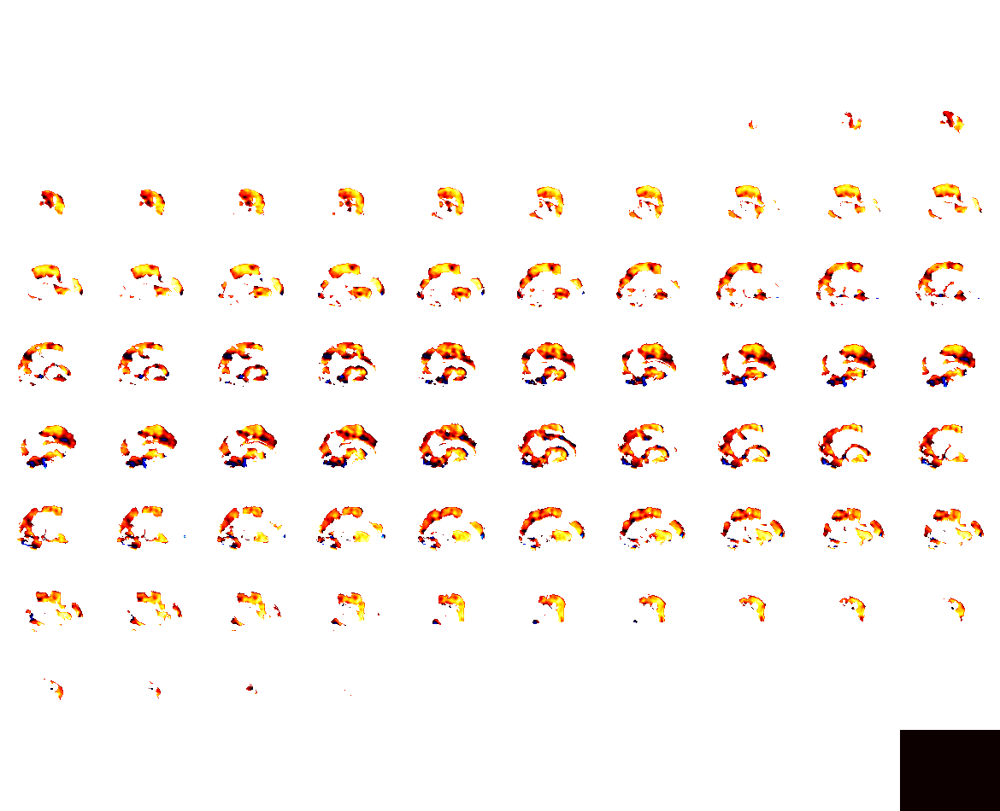

In [117]:
plotting.view_img(icc_supra_imgs[9], vmax = 1)

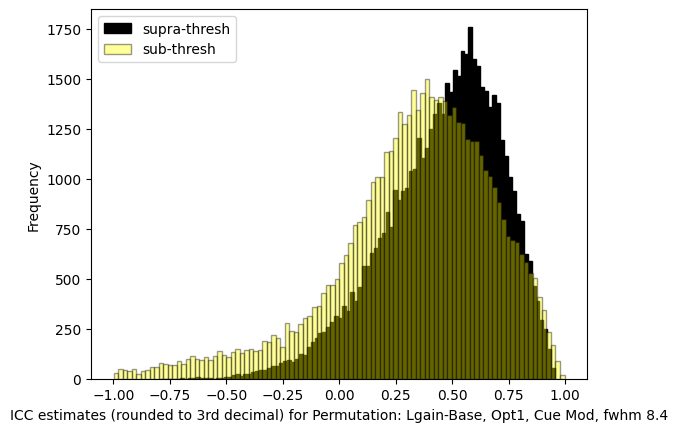

In [63]:
masked_supra_data = masking.apply_mask(icc_supra_imgs[9], mask_supra)
masked_sub_data = masking.apply_mask(icc_sub_imgs[9], mask_sub)
sub_data_subsample = np.random.choice(masked_sub_data, len(masked_supra_data), replace=False)

# Plot the distribution
plt.hist(np.round(masked_supra_data, decimals=3), bins=100, edgecolor='black',  color='black',
         alpha = 1, label='supra-thresh')  # supra-threshold mask
plt.hist(np.round(sub_data_subsample, decimals=3), bins=100, edgecolor='black', color='yellow', 
         alpha = .4, label='sub-thresh')  # sub-threshold mask

plt.xlabel('ICC estimates (rounded to 3rd decimal) for Permutation: Lgain-Base, Opt1, Cue Mod, fwhm 8.4')
plt.ylabel('Frequency')
plt.legend()
plt.show()

### sort MSBS by median est + img of highest

In [109]:
df_bs_sub.sort_values(by='median_est', ascending=False)

,mask,con,motion,model,fwhm,median_est
155,mask-wilson-sub,contrast-Sgain-Base,mot-opt1,mod-CueMod,fwhm-3.6,7.829
5,mask-wilson-sub,contrast-Lgain-Base,mot-opt1,mod-CueMod,fwhm-3.6,7.433
156,mask-wilson-sub,contrast-Sgain-Base,mot-opt1,mod-CueMod,fwhm-4.8,6.198
6,mask-wilson-sub,contrast-Lgain-Base,mot-opt1,mod-CueMod,fwhm-4.8,5.906
157,mask-wilson-sub,contrast-Sgain-Base,mot-opt1,mod-CueMod,fwhm-6.0,5.217
...,...,...,...,...,...,...
124,mask-wilson-sub,contrast-Lgain-Neut,mot-opt4,mod-AntMod,fwhm-8.4,0.144
288,mask-wilson-sub,contrast-Sgain-Neut,mot-opt5,mod-AntMod,fwhm-7.2,0.142
139,mask-wilson-sub,contrast-Lgain-Neut,mot-opt5,mod-AntMod,fwhm-8.4,0.135
274,mask-wilson-sub,contrast-Sgain-Neut,mot-opt4,mod-AntMod,fwhm-8.4,0.135



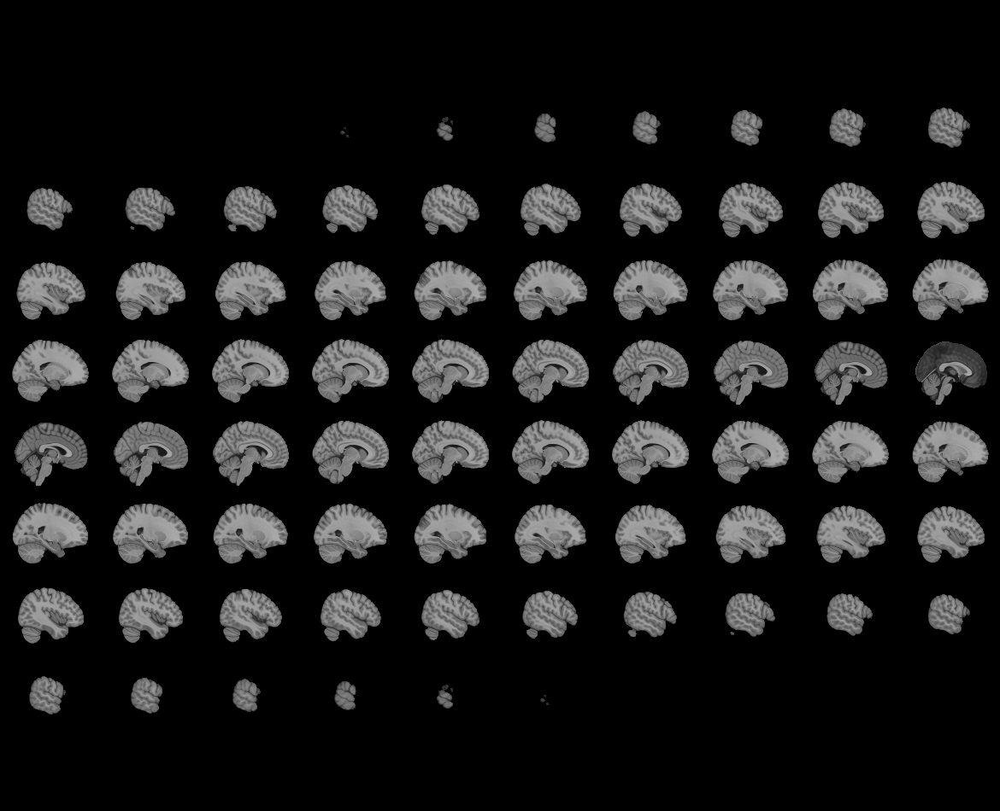
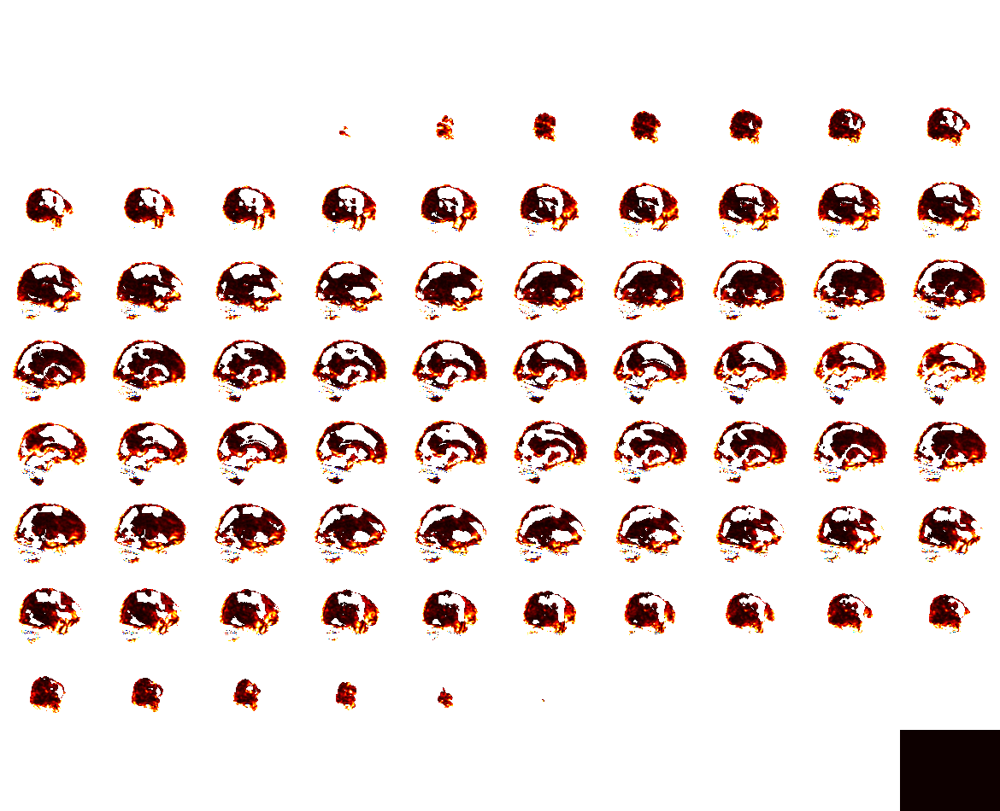

In [116]:
plotting.view_img(bs_sub_imgs[155], vmax=50)

In [112]:
df_bs_supra.sort_values(by='median_est', ascending=False)

,mask,con,motion,model,fwhm,median_est
155,mask-wilson-supra,contrast-Sgain-Base,mot-opt1,mod-CueMod,fwhm-3.6,4.880
5,mask-wilson-supra,contrast-Lgain-Base,mot-opt1,mod-CueMod,fwhm-3.6,4.459
156,mask-wilson-supra,contrast-Sgain-Base,mot-opt1,mod-CueMod,fwhm-4.8,4.013
6,mask-wilson-supra,contrast-Lgain-Base,mot-opt1,mod-CueMod,fwhm-4.8,3.654
157,mask-wilson-supra,contrast-Sgain-Base,mot-opt1,mod-CueMod,fwhm-6.0,3.508
...,...,...,...,...,...,...
288,mask-wilson-supra,contrast-Sgain-Neut,mot-opt5,mod-AntMod,fwhm-7.2,0.080
139,mask-wilson-supra,contrast-Lgain-Neut,mot-opt5,mod-AntMod,fwhm-8.4,0.078
124,mask-wilson-supra,contrast-Lgain-Neut,mot-opt4,mod-AntMod,fwhm-8.4,0.076
274,mask-wilson-supra,contrast-Sgain-Neut,mot-opt4,mod-AntMod,fwhm-8.4,0.072



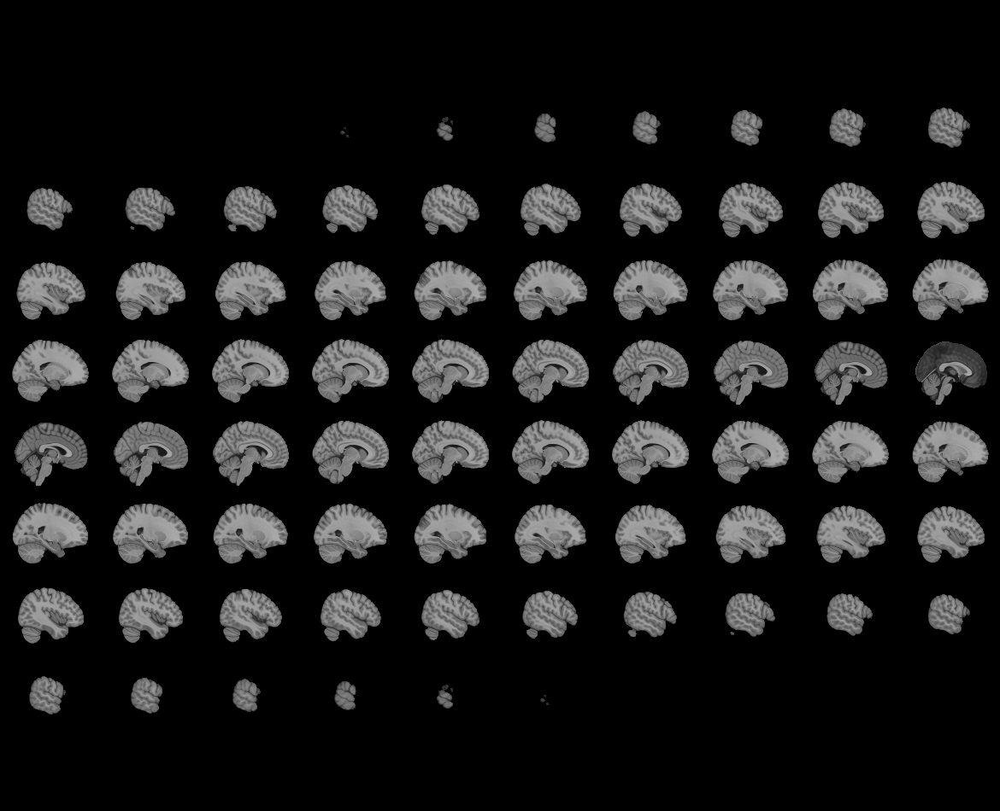
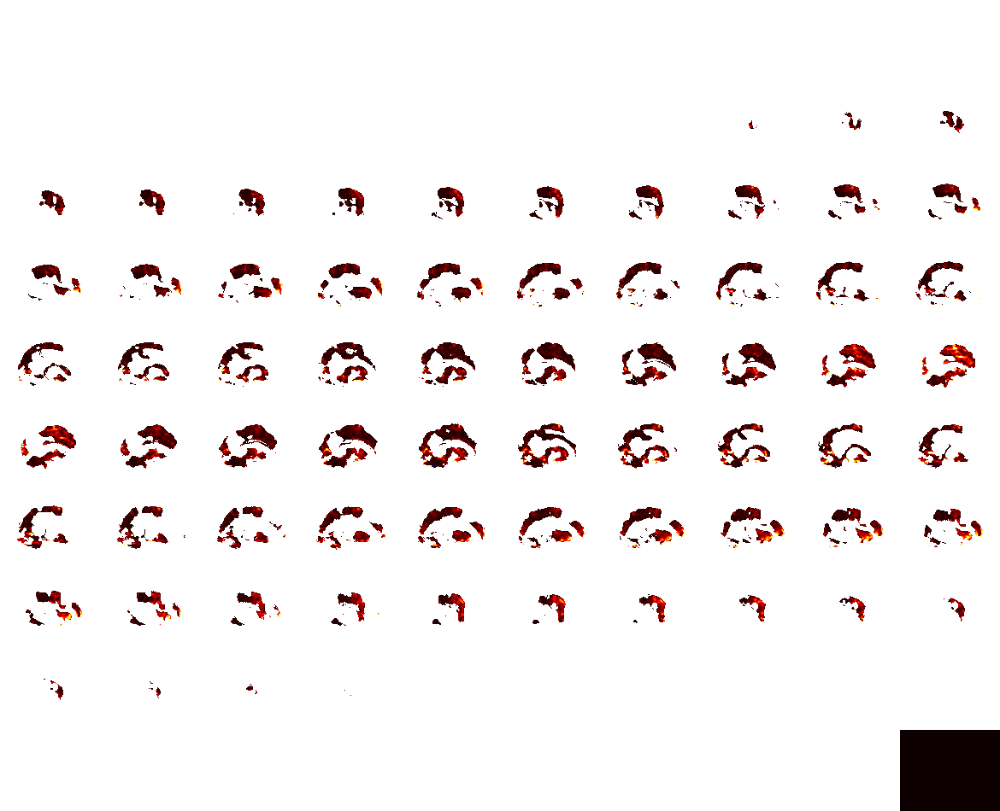

In [115]:
plotting.view_img(bs_supra_imgs[155], vmax=50)

In [129]:
len(masked_sub_data), len(masked_supra_data), len(sub_data_subsample)

(180587, 55257, 55257)

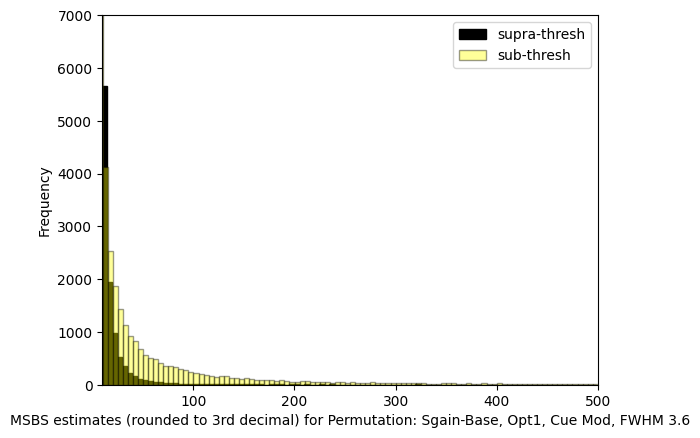

In [137]:
masked_supra_data = masking.apply_mask(bs_supra_imgs[155], mask_supra)
masked_supra_data_filter = masked_supra_data[masked_supra_data <=500]
masked_sub_data = masking.apply_mask(bs_sub_imgs[155], mask_sub)
sub_data_subsample = np.random.choice(masked_sub_data, len(masked_supra_data), replace=False)
sub_data_subsample_filter = sub_data_subsample[sub_data_subsample <= 500]
# Plot the distribution
plt.hist(np.round(masked_supra_data_filter, decimals=1), bins=100, edgecolor='black',  color='black',
         alpha = 1, label='supra-thresh')  # supra-threshold mask
plt.hist(np.round(sub_data_subsample_filter, decimals=1), bins=100, edgecolor='black', color='yellow', 
         alpha = .4, label='sub-thresh')  # sub-threshold mask

plt.xlabel('MSBS estimates (rounded to 3rd decimal) for Permutation: Sgain-Base, Opt1, Cue Mod, FWHM 3.6')
plt.ylabel('Frequency')
# Set x-axis limits
plt.xlim(10, 500)
plt.ylim(0,7000)
plt.legend()
plt.show()

### sort MSWS by median est + img of highest

In [139]:
df_ws_sub.sort_values(by='median_est', ascending=True)

,mask,con,motion,model,fwhm,median_est
139,mask-wilson-sub,contrast-Lgain-Neut,mot-opt5,mod-AntMod,fwhm-8.4,0.118
289,mask-wilson-sub,contrast-Sgain-Neut,mot-opt5,mod-AntMod,fwhm-8.4,0.119
124,mask-wilson-sub,contrast-Lgain-Neut,mot-opt4,mod-AntMod,fwhm-8.4,0.127
288,mask-wilson-sub,contrast-Sgain-Neut,mot-opt5,mod-AntMod,fwhm-7.2,0.138
138,mask-wilson-sub,contrast-Lgain-Neut,mot-opt5,mod-AntMod,fwhm-7.2,0.139
...,...,...,...,...,...,...
150,mask-wilson-sub,contrast-Sgain-Base,mot-opt1,mod-AntMod,fwhm-3.6,3.764
5,mask-wilson-sub,contrast-Lgain-Base,mot-opt1,mod-CueMod,fwhm-3.6,3.840
156,mask-wilson-sub,contrast-Sgain-Base,mot-opt1,mod-CueMod,fwhm-4.8,3.909
230,mask-wilson-sub,contrast-Sgain-Neut,mot-opt1,mod-CueMod,fwhm-3.6,4.406



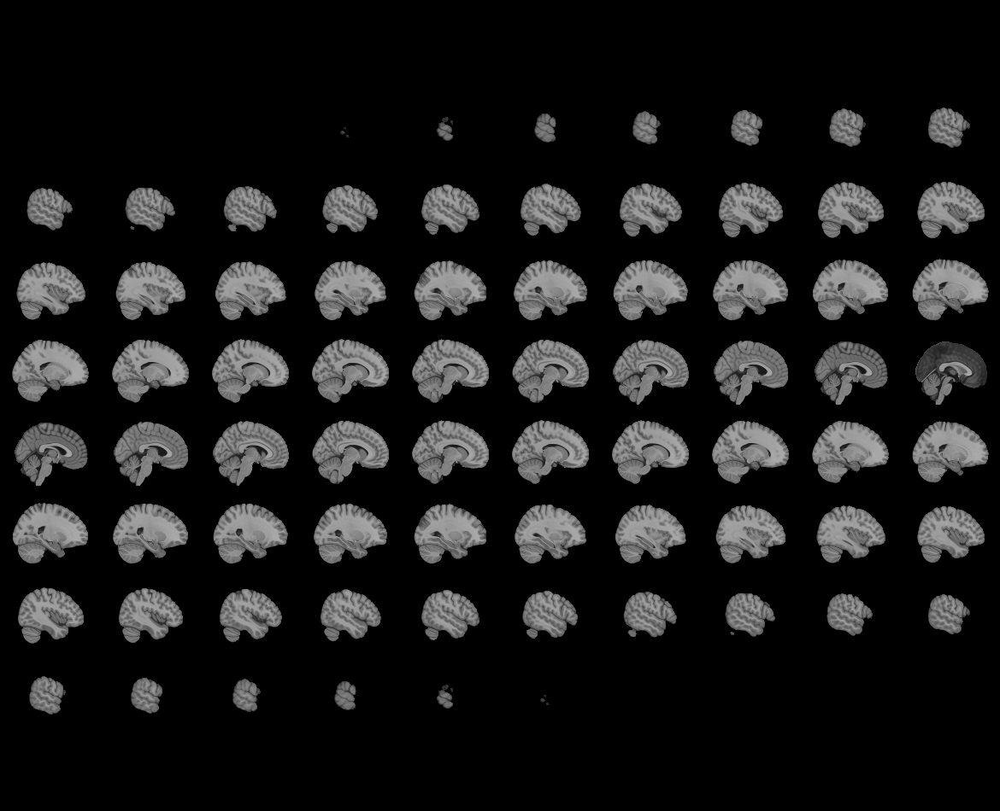
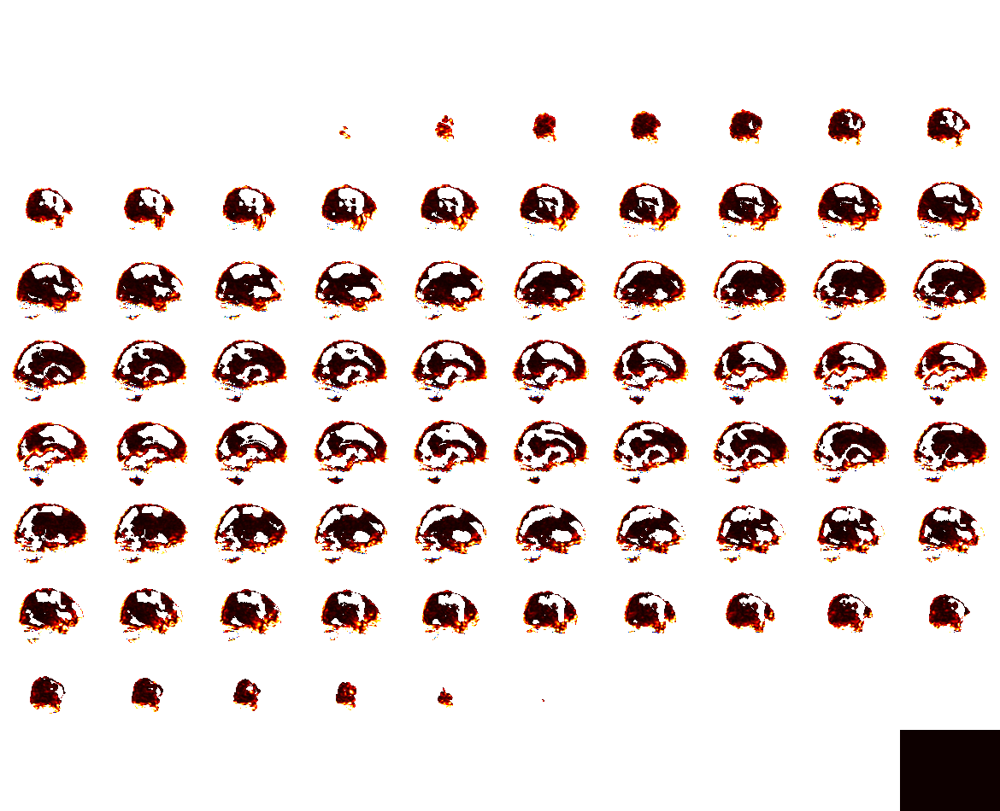

In [123]:
plotting.view_img(ws_sub_imgs[155], vmax=50)

In [138]:
df_ws_supra.sort_values(by='median_est', ascending=True)

,mask,con,motion,model,fwhm,median_est
289,mask-wilson-supra,contrast-Sgain-Neut,mot-opt5,mod-AntMod,fwhm-8.4,0.072
139,mask-wilson-supra,contrast-Lgain-Neut,mot-opt5,mod-AntMod,fwhm-8.4,0.074
124,mask-wilson-supra,contrast-Lgain-Neut,mot-opt4,mod-AntMod,fwhm-8.4,0.078
288,mask-wilson-supra,contrast-Sgain-Neut,mot-opt5,mod-AntMod,fwhm-7.2,0.083
274,mask-wilson-supra,contrast-Sgain-Neut,mot-opt4,mod-AntMod,fwhm-8.4,0.086
...,...,...,...,...,...,...
160,mask-wilson-supra,contrast-Sgain-Base,mot-opt1,mod-FixMod,fwhm-3.6,2.293
232,mask-wilson-supra,contrast-Sgain-Neut,mot-opt1,mod-CueMod,fwhm-6.0,2.361
231,mask-wilson-supra,contrast-Sgain-Neut,mot-opt1,mod-CueMod,fwhm-4.8,2.672
155,mask-wilson-supra,contrast-Sgain-Base,mot-opt1,mod-CueMod,fwhm-3.6,2.806


In [ ]:
plotting.view_img(ws_supra_imgs[230], vmax=10)

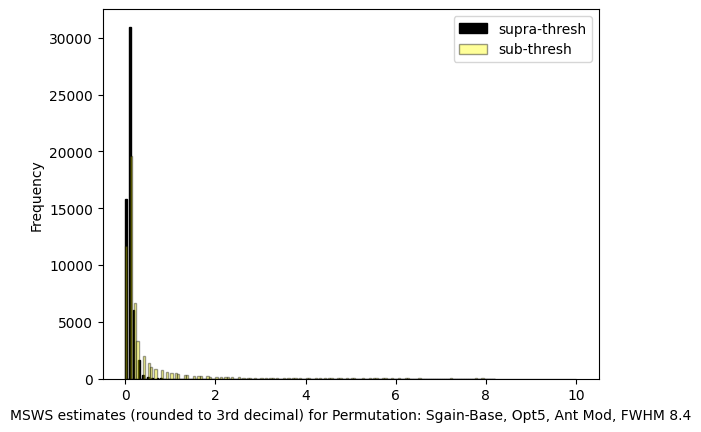

In [147]:
masked_supra_data = masking.apply_mask(ws_supra_imgs[289], mask_supra)
masked_supra_data_filter = masked_supra_data[masked_supra_data <=10]

masked_sub_data = masking.apply_mask(ws_sub_imgs[289], mask_sub)
sub_data_subsample = np.random.choice(masked_sub_data, len(masked_supra_data), replace=False)
sub_data_subsample_filter = sub_data_subsample[sub_data_subsample <= 10]

# Plot the distribution
plt.hist(np.round(masked_supra_data_filter, decimals=1), bins=200, edgecolor='black',  color='black',
         alpha = 1, label='supra-thresh')  # supra-threshold mask
plt.hist(np.round(sub_data_subsample_filter, decimals=1), bins=200, edgecolor='black', color='yellow', 
         alpha = .4, label='sub-thresh')  # sub-threshold mask

plt.xlabel('MSWS estimates (rounded to 3rd decimal) for Permutation: Sgain-Base, Opt5, Ant Mod, FWHM 8.4')
plt.ylabel('Frequency')
# Set x-axis limits
plt.legend()
plt.show()

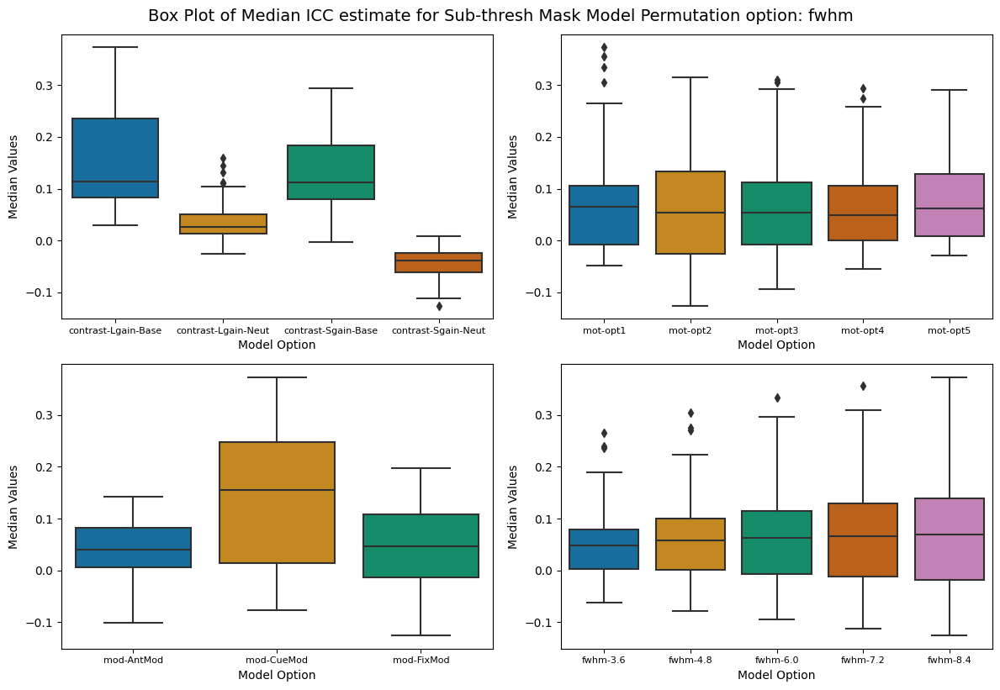

In [149]:
sns.set_palette("colorblind")


# List of labels to loop over
labels = ['con', 'motion', 'model', 'fwhm']

# Set up a 2x2 subplot
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Loop over labels and create box plots
for i, label in enumerate(labels):
    # Create a box plot for the current label
    sns.boxplot(x=label, y='median_est', data=df_icc_sub, ax=axes[i])
    
    # Set subplot labels and title
    axes[i].set_xlabel('Model Option')
    axes[i].set_ylabel('Median Values')
    axes[i].tick_params(axis='x', labelsize=8)


# Adjust layout for better spacing
plt.tight_layout()
plt.suptitle(f'Box Plot of Median ICC estimate for Sub-thresh Mask Model Permutation option: {label}', 
             fontsize=14, y=1.02)

# Show the plot
plt.show()

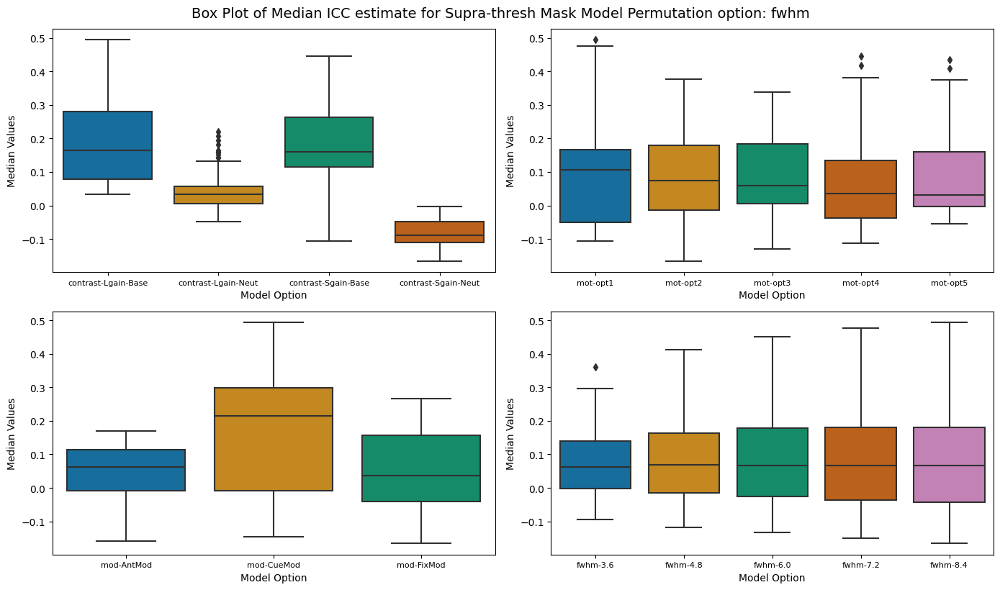

In [150]:
# Set up a 2x2 subplot
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 8))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Loop over labels and create box plots
for i, label in enumerate(labels):
    # Create a box plot for the current label
    sns.boxplot(x=label, y='median_est', data=df_icc_supra, ax=axes[i])
    
    # Set subplot labels and title
    axes[i].set_xlabel('Model Option')
    axes[i].set_ylabel('Median Values')
    axes[i].tick_params(axis='x', labelsize=8)


# Adjust layout for better spacing
plt.tight_layout()
plt.suptitle(f'Box Plot of Median ICC estimate for Supra-thresh Mask Model Permutation option: {label}', 
             fontsize=14, y=1.02)

# Show the plot
plt.show()

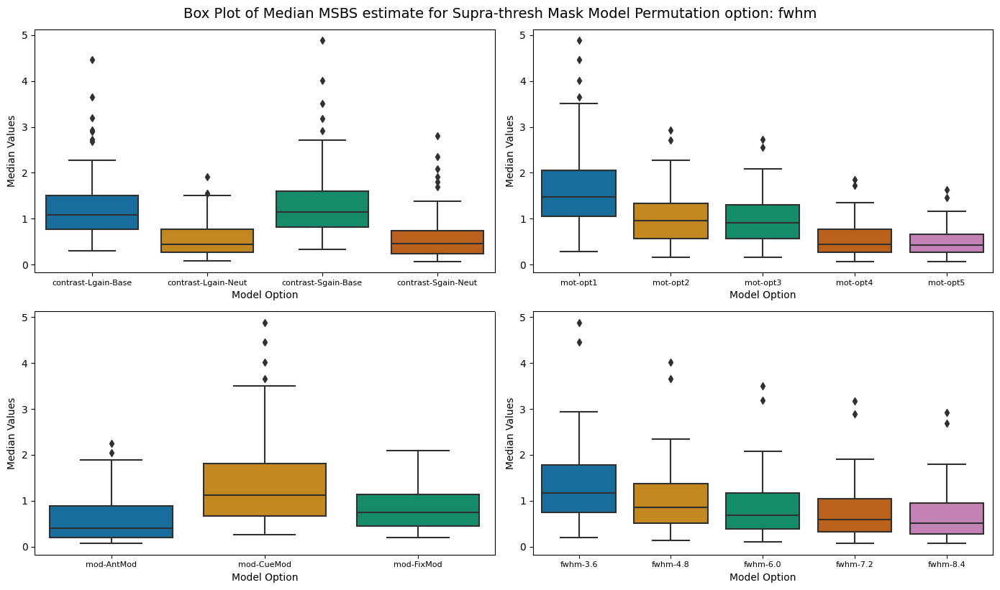

In [152]:
# Set up a 2x2 subplot
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 8))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Loop over labels and create box plots
for i, label in enumerate(labels):
    # Create a box plot for the current label
    sns.boxplot(x=label, y='median_est', data=df_bs_supra, ax=axes[i])
    
    # Set subplot labels and title
    axes[i].set_xlabel('Model Option')
    axes[i].set_ylabel('Median Values')
    axes[i].tick_params(axis='x', labelsize=8)


# Adjust layout for better spacing
plt.tight_layout()
plt.suptitle(f'Box Plot of Median MSBS estimate for Supra-thresh Mask Model Permutation option: {label}', 
             fontsize=14, y=1.02)

# Show the plot
plt.show()

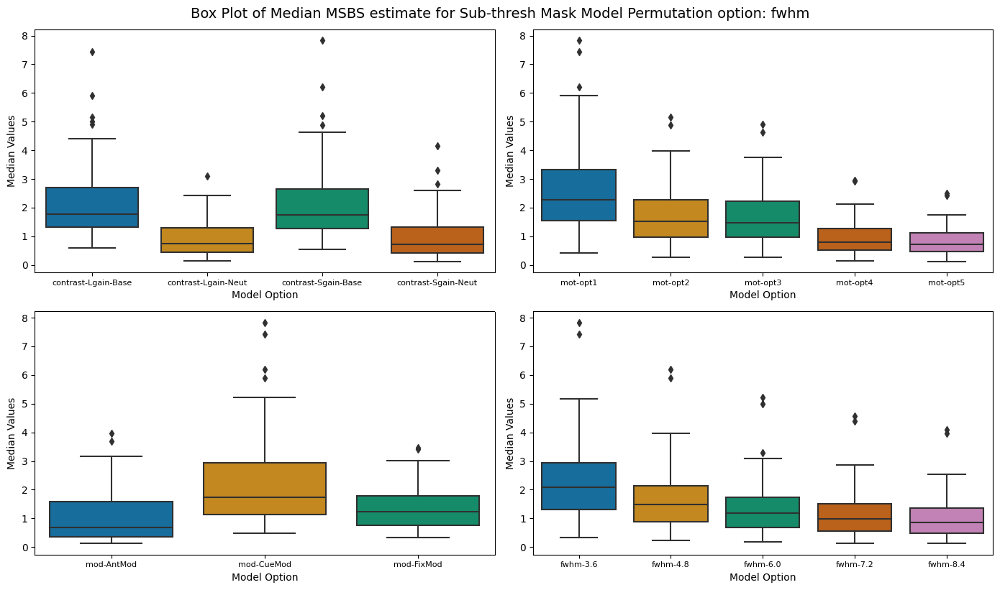

In [153]:
# Set up a 2x2 subplot
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 8))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Loop over labels and create box plots
for i, label in enumerate(labels):
    # Create a box plot for the current label
    sns.boxplot(x=label, y='median_est', data=df_bs_sub, ax=axes[i])
    
    # Set subplot labels and title
    axes[i].set_xlabel('Model Option')
    axes[i].set_ylabel('Median Values')
    axes[i].tick_params(axis='x', labelsize=8)


# Adjust layout for better spacing
plt.tight_layout()
plt.suptitle(f'Box Plot of Median MSBS estimate for Sub-thresh Mask Model Permutation option: {label}', 
             fontsize=14, y=1.02)

# Show the plot
plt.show()

# Group-wise similarity extract

## Jaccards & spearman similarity

As described in the registered report:

*"Jaccard similarity coefficient is sensitive to thresholding and sample size (Bennett & Miller, 2010), in Aim 1 an equal sample size (e.g., N ~ 60) is chosen for each study to compare how the similarity between sessions varies across studies. For all 360 pipelines, a group-level (average) activation map is estimated for each session. In the case of the Jaccard coefficient, the group maps are thresholded at p < .001. In the case of the Spearman coefficient, the group maps are masked using a suprathreshold task-positive map from NeuroVault. Then, the paths for the pipelines and sessions are called using the pairwise_similarity within the similarity.py script. The resulting coefficients report the similarity between analytic pipelines and sessions for each study. For each study, the coefficients are plotted to reflect the distribution and range of coefficients. Both Jaccards and Spearman correlation are reported separately. Like Aim 1 & Aim 2, two HLMs are used to regress the Jaccard coefficients and Spearman correlation on the [four] analytic decisions nested within study. Multiple comparisons corrections are applied using the Tukey adjustment."*

In [160]:
contrasts = [
    'Lgain-Neut', 'Sgain-Neut',
    'Lgain-Base', 'Sgain-Base'
]

# Model permutations
if sample in ['abcd', 'ahrb']:
    voxel = 2.4
    opts = np.array([1.5,  2, 2.5, 3, 3.5])
    fwhm_opt = list(np.round(voxel * opts, 2))
elif sample in 'mls':
    voxel = 2.4
    inh_smooth_weight = .75
    opts = np.array([1.5, 2, 2.5, 3, 3.5])*inh_smooth_weight
    fwhm_opt = list(np.round(voxel * opts, 2))

motion_opt = ["opt1", "opt2", "opt3", "opt4", "opt5"]
modtype_opt = ["CueMod", "AntMod", "FixMod"]

permutation_list = list(product(contrasts, fwhm_opt, motion_opt, modtype_opt))

In [173]:
threshold = 1.5 # n = 20, so no need to do 3.1 for now
similar_list = []
n = 0
for con, fwhm, motion, model in permutation_list:
    n = n + 1
    print(f'Running {n} out of {len(permutation_list)}')
    img1 = f'{group_out}/*_ses-baselineYear1Arm1_*_run-01_contrast-{con}_*_mot-{motion}_mod-{model}_fwhm-{fwhm}_stat-tstat.nii.gz'
    img2 = f'{group_out}/*_ses-baselineYear1Arm1_*_run-02_contrast-{con}_*_mot-{motion}_mod-{model}_fwhm-{fwhm}_stat-tstat.nii.gz'
    jaccard = similarity.image_similarity(imgfile1=img1, imgfile2=img2, thresh = threshold, similarity_type = 'jaccard')
    spearman = similarity.image_similarity(imgfile1=img1, imgfile2=img2, mask=mask_supra, similarity_type = 'spearman')

    similar_list.append({
        'con': con,
        'fwhm': fwhm,
        'motion': motion,
        'model': model,
        'jaccard': jaccard,
        'spearman': spearman
    })
 

Running 1 out of 300
Running 2 out of 300
Running 3 out of 300
Running 4 out of 300
Running 5 out of 300
Running 6 out of 300
Running 7 out of 300
Running 8 out of 300
Running 9 out of 300
Running 10 out of 300
Running 11 out of 300
Running 12 out of 300
Running 13 out of 300
Running 14 out of 300
Running 15 out of 300
Running 16 out of 300
Running 17 out of 300
Running 18 out of 300
Running 19 out of 300
Running 20 out of 300
Running 21 out of 300
Running 22 out of 300
Running 23 out of 300
Running 24 out of 300
Running 25 out of 300
Running 26 out of 300
Running 27 out of 300
Running 28 out of 300
Running 29 out of 300
Running 30 out of 300
Running 31 out of 300
Running 32 out of 300
Running 33 out of 300
Running 34 out of 300
Running 35 out of 300
Running 36 out of 300
Running 37 out of 300
Running 38 out of 300
Running 39 out of 300
Running 40 out of 300
Running 41 out of 300
Running 42 out of 300
Running 43 out of 300
Running 44 out of 300
Running 45 out of 300
Running 46 out of 3

In [178]:
similarity_df = pd.DataFrame(similar_list)
similarity_df.to_csv(out_similarity, sep='\t', index=False)

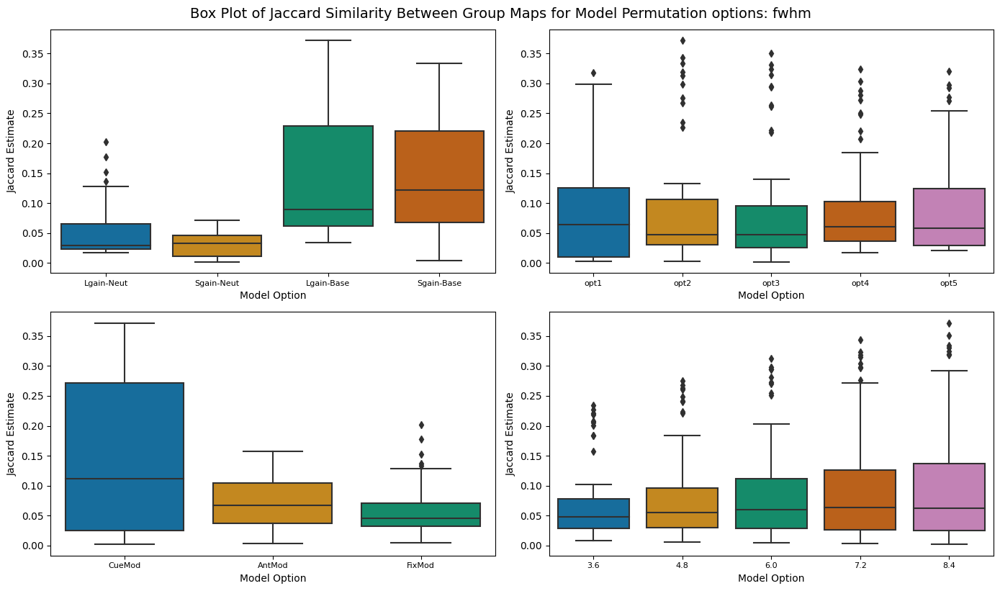

In [175]:
# Set up a 2x2 subplot
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 8))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Loop over labels and create box plots
for i, label in enumerate(labels):
    # Create a box plot for the current label
    sns.boxplot(x=label, y='jaccard', data=similarity_df, ax=axes[i])
    
    # Set subplot labels and title
    axes[i].set_xlabel('Model Option')
    axes[i].set_ylabel('Jaccard Estimate')
    axes[i].tick_params(axis='x', labelsize=8)


# Adjust layout for better spacing
plt.tight_layout()
plt.suptitle(f'Box Plot of Jaccard Similarity Between Group Maps for Model Permutation options: {label}', 
             fontsize=14, y=1.02)

# Show the plot
plt.show()

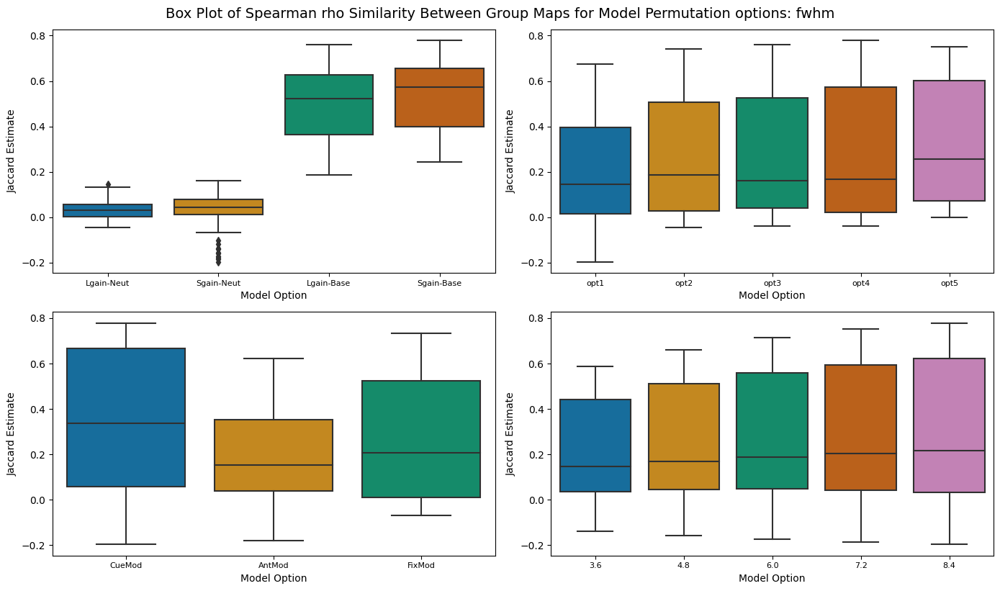

In [176]:
# Set up a 2x2 subplot
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 8))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Loop over labels and create box plots
for i, label in enumerate(labels):
    # Create a box plot for the current label
    sns.boxplot(x=label, y='spearman', data=similarity_df, ax=axes[i])
    
    # Set subplot labels and title
    axes[i].set_xlabel('Model Option')
    axes[i].set_ylabel('Jaccard Estimate')
    axes[i].tick_params(axis='x', labelsize=8)


# Adjust layout for better spacing
plt.tight_layout()
plt.suptitle(f'Box Plot of Spearman rho Similarity Between Group Maps for Model Permutation options: {label}', 
             fontsize=14, y=1.02)

# Show the plot
plt.show()